<a href="https://colab.research.google.com/github/Jathurshan0330/Cine-Cardiac-MRI-Motion-Artefact-Reduction/blob/master/Training_Recurrent_Generative_Adversarial_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Get Requirements

In [1]:
!git clone https://github.com/Jathurshan0330/Cine-Cardiac-MRI-Motion-Artefact-Reduction.git

Cloning into 'Cine-Cardiac-MRI-Motion-Artefact-Reduction'...
remote: Enumerating objects: 99, done.
remote: Counting objects: 100% (99/99), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 99 (delta 51), reused 40 (delta 14), pack-reused 0
Unpacking objects: 100% (99/99), done.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from IPython.display import clear_output

In [4]:
!pip install neptune-client
!pip install medpy
clear_output()

In [5]:
%cd /content/Cine-Cardiac-MRI-Motion-Artefact-Reduction
import neptune.new as neptune
import torch
import os
from glob import glob
import time
import re
import argparse
import nibabel as nib
import pandas as pd
from medpy.metric.binary import hd, dc
import numpy as np
from ipywidgets import interact, interactive, IntSlider, ToggleButtons
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import torch
import torch.nn as nn
sns.set_style('darkgrid')
from seaborn.matrix import clustermap
import h5py
from matplotlib.patches import Rectangle
from torch.utils.data import Dataset
from torch.utils import data
from torchvision import transforms, datasets
from torchvision.transforms.transforms import ToTensor
from torchvision import models
from torch import autograd
from matplotlib.animation import FuncAnimation
from IPython import display
from torchvision.utils import make_grid
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import time
import random

from utils.metrics_acdc import load_nii
from utils.vis_cine import interactive_gif_data, AnimationFunction
from utils.avg_metrics import AverageMeter, img_net_normalize, weights_init
from datasets.cine_dataset import read_h5py, calculate_2dft, calculate_2dift, add_motion_artefacts, CineCardiac
from model.networks import  ConvLSTM_block, Generator, Discriminator, Vgg16, gradient_penalty 
# conv_block, convtranspose_block, multi_scale_conv, ConvLSTMCell, ConvLSTM, ConvLSTM_block, encoder, decoder,

/content/Cine-Cardiac-MRI-Motion-Artefact-Reduction


# Load Dataset 

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [7]:
#Cine Cardiac MRI Dataset
train_data = glob("/content/drive/MyDrive/Cine Cardiac/train_data/train_*_slice_*.h5")
val_data = glob("/content/drive/MyDrive/Cine Cardiac/val_data/val_*_slice_*.h5")
print(train_data)
print(val_data)


cine_train = CineCardiac(data_list = train_data, 
                          device = device, 
                          transform=transforms.Compose([
                          transforms.ToTensor(),
                          ])) 

cine_val = CineCardiac(data_list = val_data, 
                          device = device, data_type = 'Val', 
                          transform=transforms.Compose([
                          transforms.ToTensor(),
                          ])) 
clear_output()

In [8]:
# Data loaders
train_data_loader = data.DataLoader(cine_train, batch_size = 1, shuffle = True)
val_data_loader = data.DataLoader(cine_val, batch_size = 1, shuffle = False)

torch.Size([1, 7, 100, 100]) torch.Size([1, 7, 100, 100]) torch.Size([1, 7, 100, 100])
tensor(0., device='cuda:0', dtype=torch.float64) tensor(0., device='cuda:0', dtype=torch.float64) tensor(0., device='cuda:0')
tensor(1., device='cuda:0', dtype=torch.float64) tensor(1., device='cuda:0', dtype=torch.float64) tensor(1., device='cuda:0')


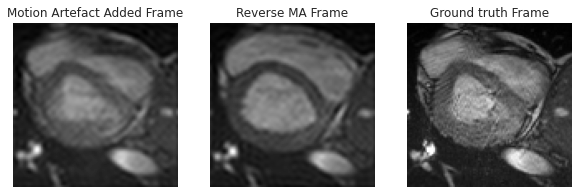

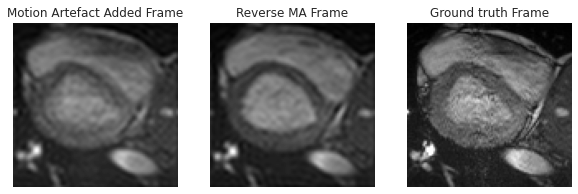

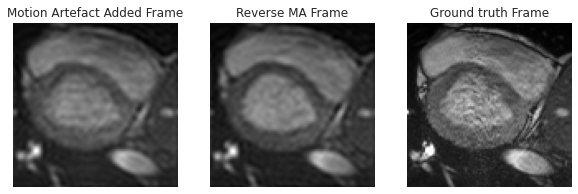

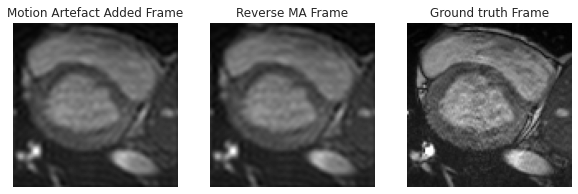

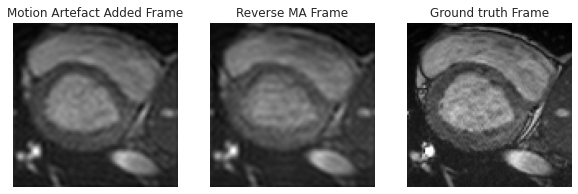

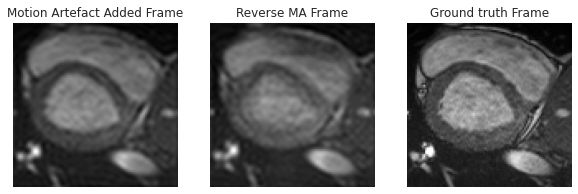

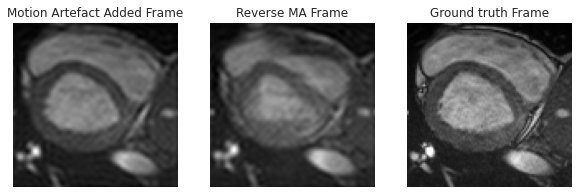

interactive(children=(IntSlider(value=0, description='Select slice', max=0), Output()), _dom_classes=('widget-…

In [9]:
img,img_inv, label   = next(iter(val_data_loader))
print(img.shape,img_inv.shape, label.shape)
print(img.min(),img_inv.min(), label.min())
print(img.max(),img_inv.max(), label.max())
ind = 0
for k in range(7):
  fig, ax = plt.subplots(1,3, figsize=(10,10))
  ax[0].imshow(img[ind,k,:,:].cpu(), cmap='gray'), ax[0].set_title('Motion Artefact Added Frame'),ax[0].axis("off")
  ax[1].imshow(img_inv[ind,k,:,:].cpu(), cmap='gray'), ax[1].set_title('Reverse MA Frame'),ax[1].axis("off")
  ax[2].imshow(label[ind,k,:,:].cpu(), cmap='gray'), ax[2].set_title('Ground truth Frame'),ax[2].axis("off")
  plt.show()  

interactive_gif_data(img.cpu(), cmap = 'gray')


In [10]:
interactive_gif_data(label.cpu(), cmap = 'gray')

interactive(children=(IntSlider(value=0, description='Select slice', max=0), Output()), _dom_classes=('widget-…

# Recurrent Generative Adversarial Neural Network

In [17]:
convlstm_forward = ConvLSTM_block().to(device)
convlstm_backward = ConvLSTM_block().to(device)
gen = Generator().to(device)
disc = Discriminator().to(device)

#For retraining
# convlstm_forward = torch.load('/content/drive/MyDrive/Cine Cardiac/Models/1convlstm_forward_best_psnr.pth.tar')
# convlstm_backward = torch.load('/content/drive/MyDrive/Cine Cardiac/Models/1convlstm_backward_best_psnr.pth.tar')
# gen = torch.load("/content/drive/MyDrive/Cine Cardiac/Models/1gen_best_psnr.pth.tar")
# disc =torch.load("/content/drive/MyDrive/Cine Cardiac/Models/1disc_best_psnr.pth.tar")

vgg =  Vgg16().to(device)

#Parameters
bce_loss = nn.BCELoss()
mse_loss = nn.MSELoss()
lr = 1e-4
beta_1 = 0.5 
beta_2 = 0.999
n_epochs = 50

for_convlstm_optimizer =  torch.optim.Adam(convlstm_forward.parameters(), lr=lr, betas=(beta_1, beta_2))
back_convlstm_optimizer =  torch.optim.Adam(convlstm_backward.parameters(), lr=lr, betas=(beta_1, beta_2))
gen_optimizer =  torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc_optimizer =  torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

#Initialize weights
# convlstm_forward = convlstm_forward.apply(weights_init)
# convlstm_backward = convlstm_backward.apply(weights_init)
# gen = gen.apply(weights_init)
# disc = disc.apply(weights_init)


#Testing the model
img,img_inv, label   = next(iter(val_data_loader))
print(img.shape,img_inv.shape, label.shape)
print(img.shape,img_inv.shape, label.shape)

sides = []
f1,f2,f3 = convlstm_forward(img.float()) 
b1,b2,b3 = convlstm_backward(img_inv.float())
print(f1.shape,f2.shape,f3.shape)
print(b1.shape,b2.shape,b3.shape)

for i in range (7):
  out_img = gen(img[:,i,:,:].view(img.shape[0],1,100,100).float(),f1[:,i,:,:,:], f2[:,i,:,:,:], f3[:,i,:,:,:],
                b1[:,i,:,:,:], b2[:,i,:,:,:], b3[:,i,:,:,:])
  pred_disc = disc(out_img)
  sides.append(out_img)
  print(out_img.shape, pred_disc.shape)


print(len(sides),sides[0].shape)

torch.Size([1, 7, 100, 100]) torch.Size([1, 7, 100, 100]) torch.Size([1, 7, 100, 100])
torch.Size([1, 7, 100, 100]) torch.Size([1, 7, 100, 100]) torch.Size([1, 7, 100, 100])
torch.Size([1, 7, 32, 100, 100]) torch.Size([1, 7, 64, 100, 100]) torch.Size([1, 7, 128, 100, 100])
torch.Size([1, 7, 32, 100, 100]) torch.Size([1, 7, 64, 100, 100]) torch.Size([1, 7, 128, 100, 100])
torch.Size([1, 1, 100, 100]) torch.Size([1, 1])
torch.Size([1, 1, 100, 100]) torch.Size([1, 1])
torch.Size([1, 1, 100, 100]) torch.Size([1, 1])
torch.Size([1, 1, 100, 100]) torch.Size([1, 1])
torch.Size([1, 1, 100, 100]) torch.Size([1, 1])
torch.Size([1, 1, 100, 100]) torch.Size([1, 1])
torch.Size([1, 1, 100, 100]) torch.Size([1, 1])
7 torch.Size([1, 1, 100, 100])


# Training 

### Neptune (For Experiment Tracking)

In [12]:
track_experiment = False  # Change to true if you want to track experiments using neptune

if track_experiment:
  
  run = neptune.init(
      project="{Project Name}",
      api_token="{Api Token}"
    # your credentials


https://app.neptune.ai/jathurshan0330/Cine-Cardiac/e/CIN-15
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api-reference/run#.stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


In [13]:
if track_experiment:
  parameters = {
      "Experiment": "Recurrent Generative Adversarial Based Network",
      'Batch Size': 1,
      'Loss': "Adversarial loss + Perception Loss",
      'Optimizer' : "Adam",
      'Learning Rate': lr,
      'Beta 1': beta_1,
      'Beta 2': beta_2,
      'n_epochs': n_epochs
  }
  run['model/parameters'] = parameters
  run['model/ConvLSTM'] = convlstm_forward
  run['model/Generator'] = gen
  run['model/Discriminator'] = disc


In [14]:
experiment = 15 #experiment number

### Train

Training Epoch : [1/50]===============================================================================>
Epoch: [1/50][0/345]	Time 4.110s (4.110s)	Speed 0.2 samples/s	Data 0.075s (0.075s)	G - Loss 0.61954 (0.61954)	D - Loss 9.97783 (9.97783)	Adversarial Loss 0.01059 (0.01059)	Perceptual Loss 6.08951 (6.08951)	
Epoch: [1/50][100/345]	Time 4.148s (4.139s)	Speed 0.2 samples/s	Data 0.078s (0.078s)	G - Loss 0.26252 (0.28917)	D - Loss 10.00000 (9.99978)	Adversarial Loss 0.00000 (0.00010)	Perceptual Loss 2.62517 (2.89069)	
Epoch: [1/50][200/345]	Time 4.137s (4.140s)	Speed 0.2 samples/s	Data 0.077s (0.078s)	G - Loss 0.24141 (0.25472)	D - Loss 10.00000 (9.99989)	Adversarial Loss 0.00000 (0.00005)	Perceptual Loss 2.41407 (2.54663)	
Epoch: [1/50][300/345]	Time 4.152s (4.140s)	Speed 0.2 samples/s	Data 0.081s (0.078s)	G - Loss 0.17324 (0.24184)	D - Loss 10.00000 (9.99993)	Adversarial Loss 0.00000 (0.00004)	Perceptual Loss 1.73238 (2.41807)	
torch.Size([100, 100])


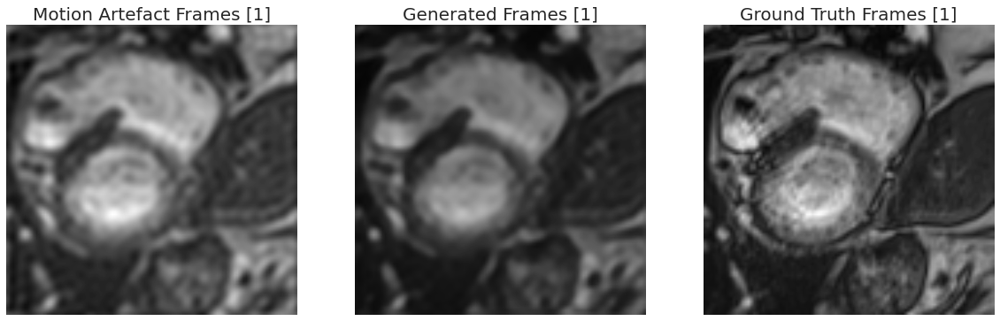

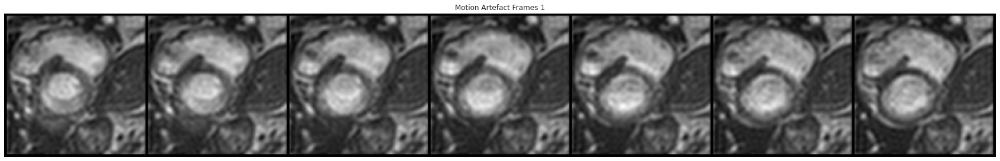

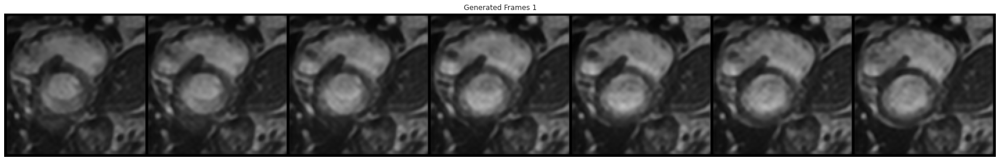

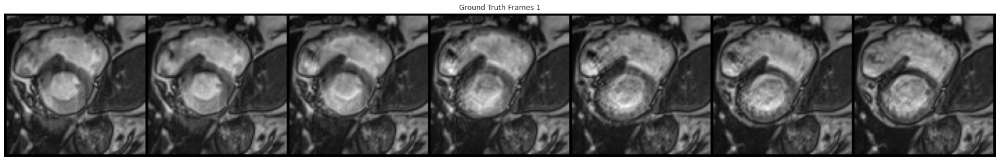

===========================================================Epoch : [1/50]  Evaluation ===========================================================================================================>
Training ===================>
Training G - Loss : 0.23856840630372364
Training D - Loss : 9.999935738936715
Validation ===================>
Validation Perceptual Loss : 0.3472452461719513
Validation PSNR            : 18.781085303931043
Validation SSIM            : 0.7322347053905733
Saving Best Model =======================================>
Saving Best Model (PSNR =======================================>
===================================== Finished training Epoch [1/50]==================================================
Training Epoch : [2/50]===============================================================================>
Epoch: [2/50][0/345]	Time 4.171s (4.171s)	Speed 0.2 samples/s	Data 0.080s (0.080s)	G - Loss 0.21383 (0.21383)	D - Loss 10.00000 (10.00000)	Adversarial Loss 0.00000 (0.00000)	

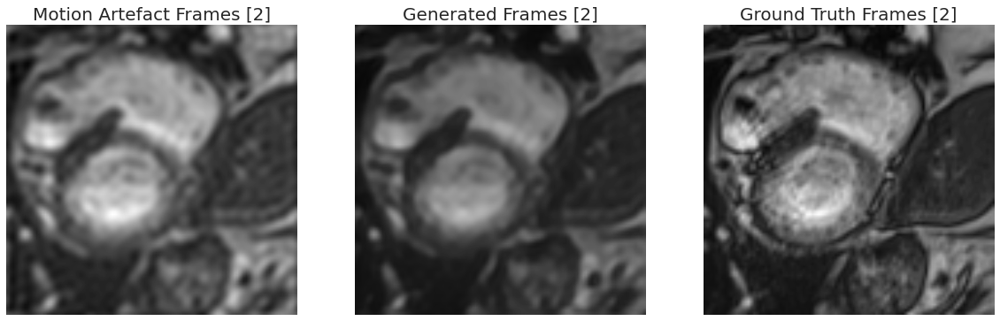

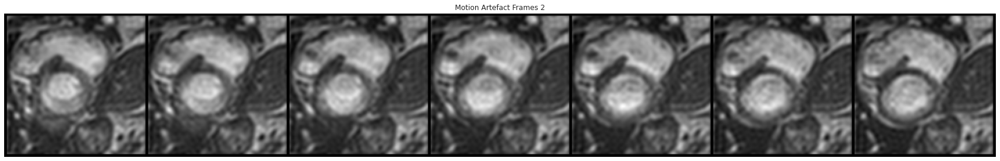

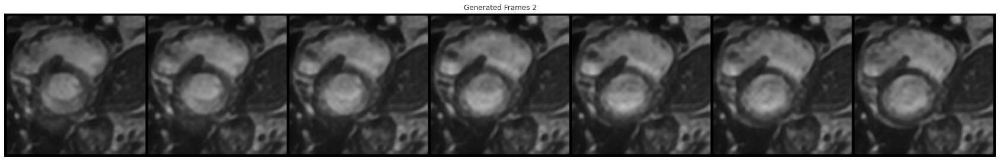

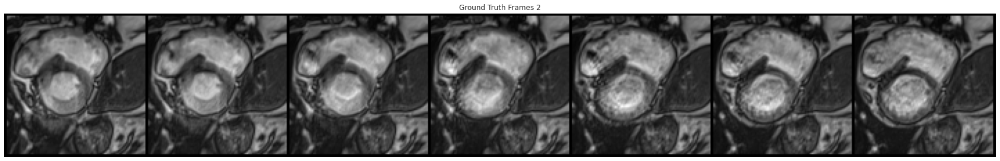

===========================================================Epoch : [2/50]  Evaluation ===========================================================================================================>
Training ===================>
Training G - Loss : 0.20629501485306284
Training D - Loss : 10.0
Validation ===================>
Validation Perceptual Loss : 0.3385121822357178
Validation PSNR            : 19.044656029510083
Validation SSIM            : 0.7263166665303133
Saving Best Model =======================================>
Saving Best Model (PSNR =======================================>
===================================== Finished training Epoch [2/50]==================================================
Training Epoch : [3/50]===============================================================================>
Epoch: [3/50][0/345]	Time 4.172s (4.172s)	Speed 0.2 samples/s	Data 0.103s (0.103s)	G - Loss 0.22317 (0.22317)	D - Loss 10.00000 (10.00000)	Adversarial Loss 0.00000 (0.00000)	Perceptual Lo

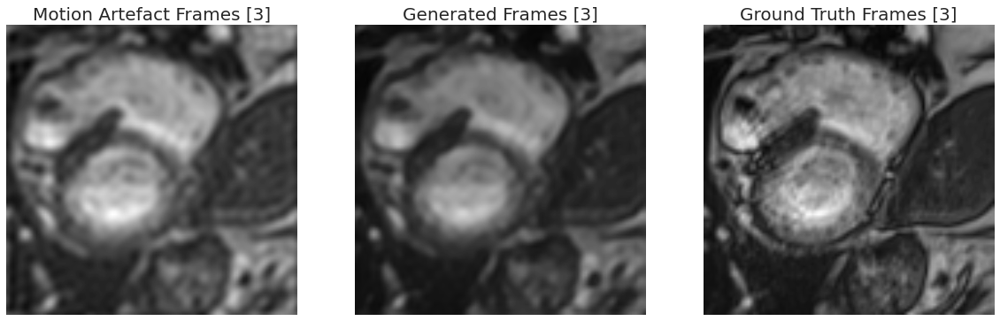

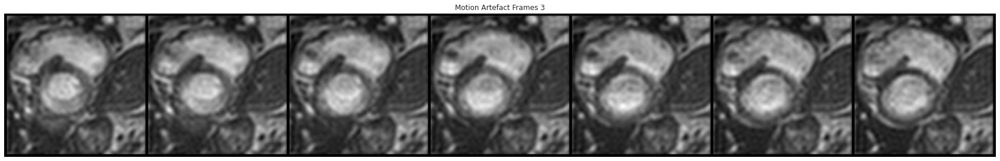

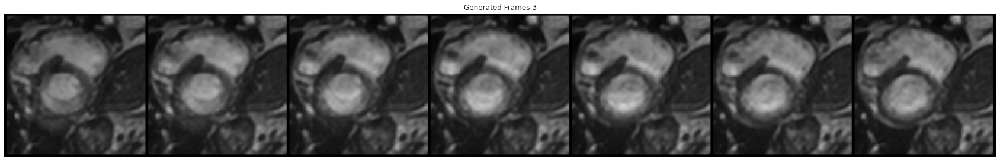

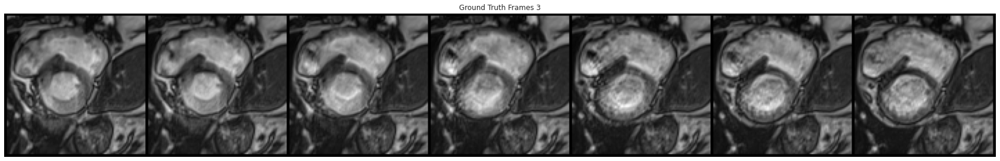

===========================================================Epoch : [3/50]  Evaluation ===========================================================================================================>
Training ===================>
Training G - Loss : 0.20008857379788939
Training D - Loss : 10.0
Validation ===================>
Validation Perceptual Loss : 0.3308182954788208
Validation PSNR            : 21.07905837967507
Validation SSIM            : 0.7565525165447523
Saving Best Model =======================================>
Saving Best Model (PSNR =======================================>
===================================== Finished training Epoch [3/50]==================================================
Training Epoch : [4/50]===============================================================================>
Epoch: [4/50][0/345]	Time 4.177s (4.177s)	Speed 0.2 samples/s	Data 0.088s (0.088s)	G - Loss 0.20506 (0.20506)	D - Loss 10.00000 (10.00000)	Adversarial Loss 0.00000 (0.00000)	Perceptual Los

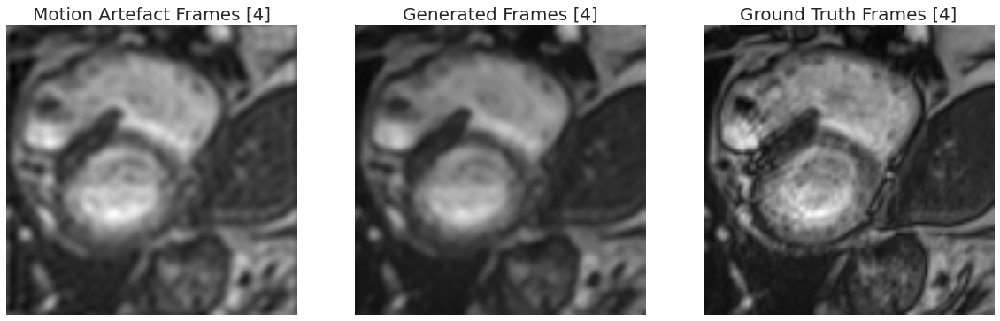

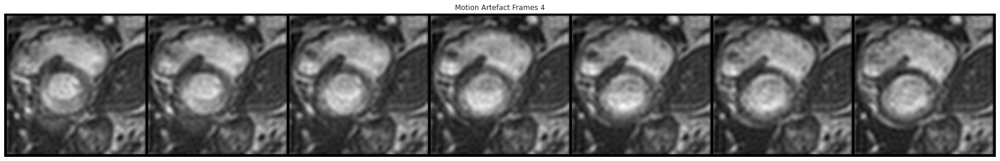

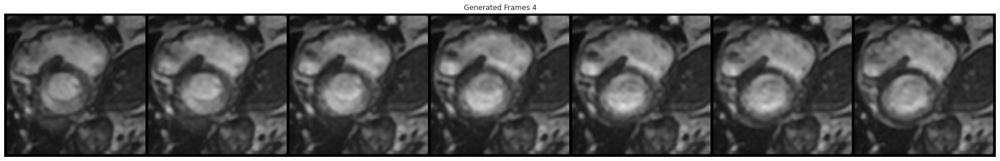

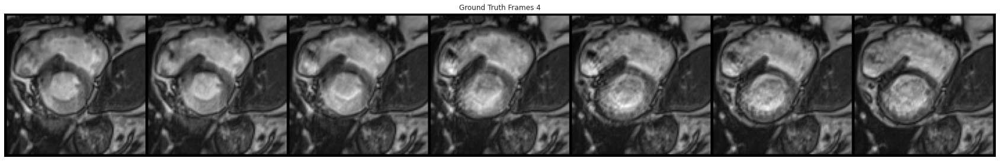

===========================================================Epoch : [4/50]  Evaluation ===========================================================================================================>
Training ===================>
Training G - Loss : 0.19623272673807282
Training D - Loss : 10.0
Validation ===================>
Validation Perceptual Loss : 0.32809990644454956
Validation PSNR            : 22.640276795178497
Validation SSIM            : 0.7688648419553809
Saving Best Model =======================================>
Saving Best Model (PSNR =======================================>
===================================== Finished training Epoch [4/50]==================================================
Training Epoch : [5/50]===============================================================================>
Epoch: [5/50][0/345]	Time 4.178s (4.178s)	Speed 0.2 samples/s	Data 0.083s (0.083s)	G - Loss 0.17455 (0.17455)	D - Loss 10.00000 (10.00000)	Adversarial Loss 0.00000 (0.00000)	Perceptual L

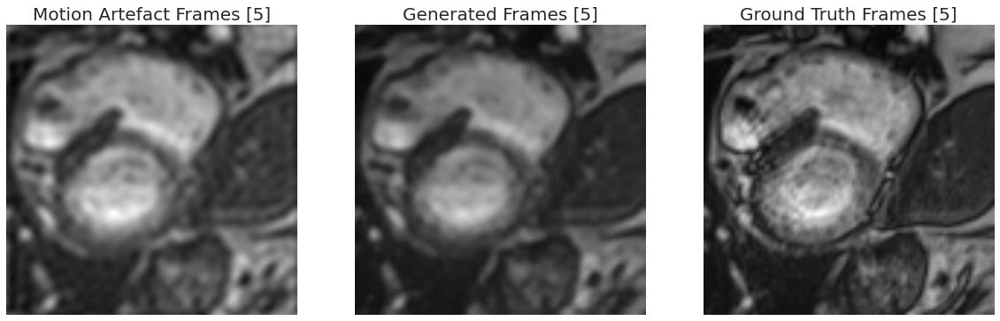

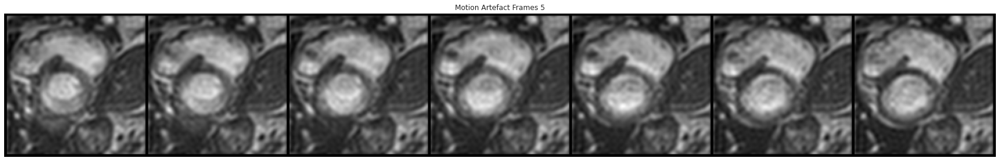

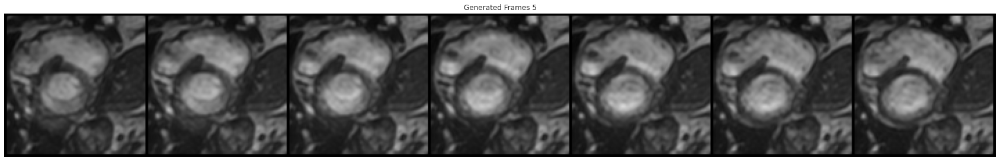

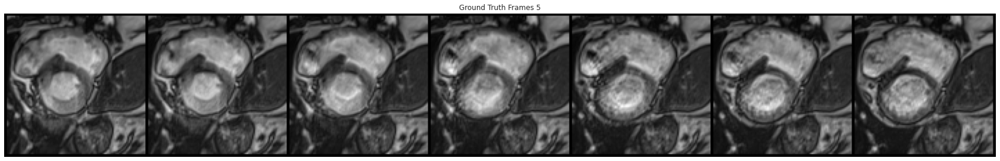

===========================================================Epoch : [5/50]  Evaluation ===========================================================================================================>
Training ===================>
Training G - Loss : 0.19312712753164596
Training D - Loss : 10.0
Validation ===================>
Validation Perceptual Loss : 0.32409724593162537
Validation PSNR            : 22.32461296447918
Validation SSIM            : 0.7679464025401916
Saving Best Model =======================================>
===================================== Finished training Epoch [5/50]==================================================
Training Epoch : [6/50]===============================================================================>
Epoch: [6/50][0/345]	Time 4.154s (4.154s)	Speed 0.2 samples/s	Data 0.082s (0.082s)	G - Loss 0.20277 (0.20277)	D - Loss 10.00000 (10.00000)	Adversarial Loss 0.00000 (0.00000)	Perceptual Loss 2.02772 (2.02772)	
Epoch: [6/50][100/345]	Time 4.135s (4.140s)

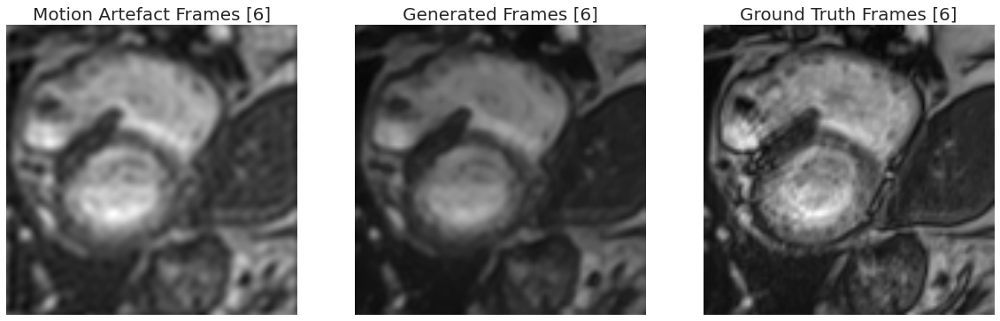

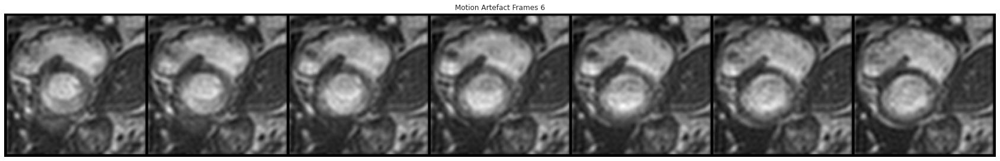

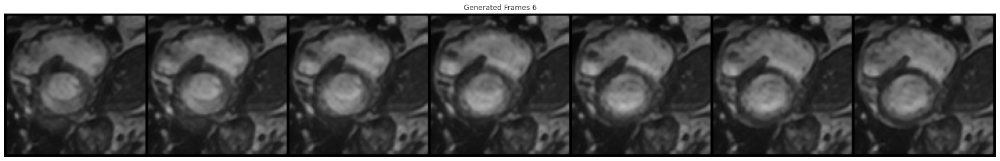

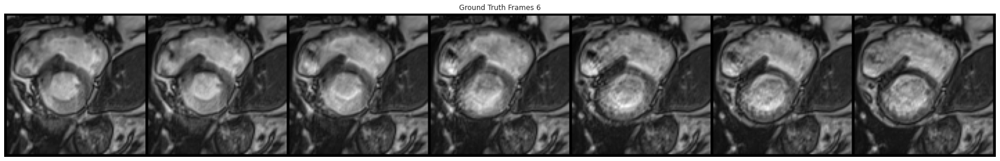

===========================================================Epoch : [6/50]  Evaluation ===========================================================================================================>
Training ===================>
Training G - Loss : 0.19021419647379198
Training D - Loss : 10.0
Validation ===================>
Validation Perceptual Loss : 0.3204522728919983
Validation PSNR            : 18.686913912296852
Validation SSIM            : 0.7307032785533948
Saving Best Model =======================================>
===================================== Finished training Epoch [6/50]==================================================
Training Epoch : [7/50]===============================================================================>
Epoch: [7/50][0/345]	Time 4.134s (4.134s)	Speed 0.2 samples/s	Data 0.088s (0.088s)	G - Loss 0.20039 (0.20039)	D - Loss 10.00000 (10.00000)	Adversarial Loss 0.00000 (0.00000)	Perceptual Loss 2.00388 (2.00388)	
Epoch: [7/50][100/345]	Time 4.091s (4.107s)

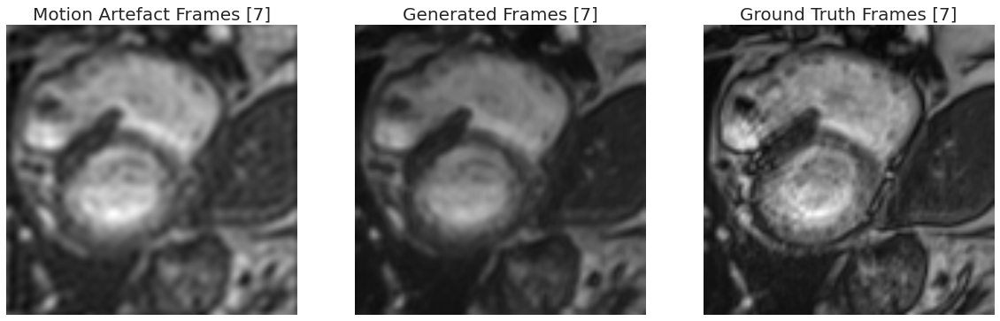

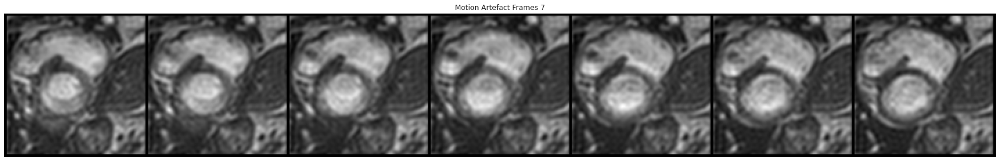

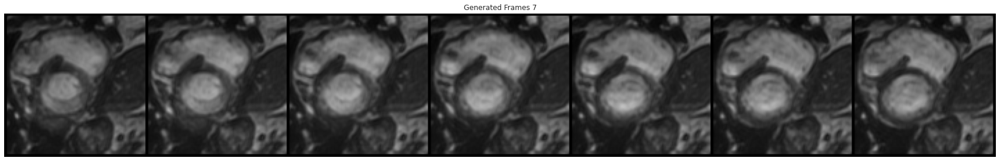

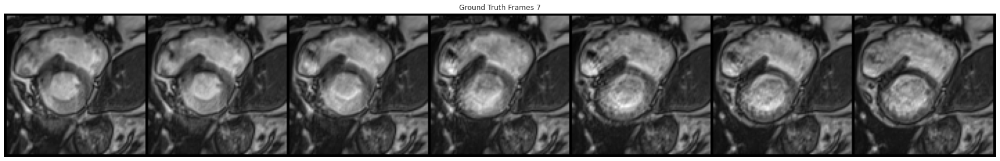

===========================================================Epoch : [7/50]  Evaluation ===========================================================================================================>
Training ===================>
Training G - Loss : 0.18722118335789528
Training D - Loss : 10.0
Validation ===================>
Validation Perceptual Loss : 0.31577640771865845
Validation PSNR            : 19.705998231031607
Validation SSIM            : 0.7372637698887765
Saving Best Model =======================================>
===================================== Finished training Epoch [7/50]==================================================
Training Epoch : [8/50]===============================================================================>
Epoch: [8/50][0/345]	Time 4.113s (4.113s)	Speed 0.2 samples/s	Data 0.087s (0.087s)	G - Loss 0.18550 (0.18550)	D - Loss 10.00000 (10.00000)	Adversarial Loss 0.00000 (0.00000)	Perceptual Loss 1.85505 (1.85505)	
Epoch: [8/50][100/345]	Time 4.102s (4.107s

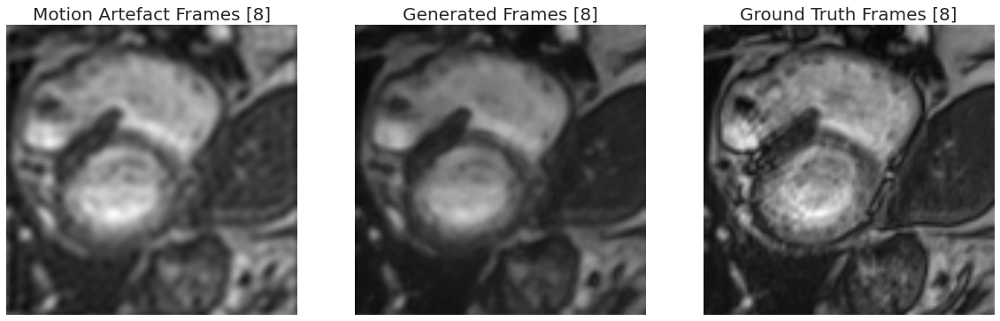

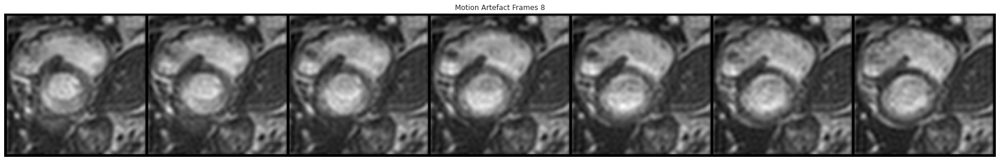

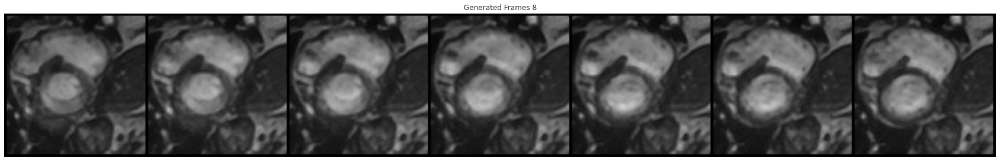

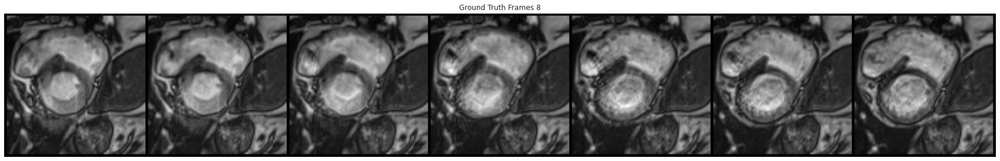

===========================================================Epoch : [8/50]  Evaluation ===========================================================================================================>
Training ===================>
Training G - Loss : 0.18388556701981504
Training D - Loss : 10.0
Validation ===================>
Validation Perceptual Loss : 0.31188151240348816
Validation PSNR            : 21.229798549016078
Validation SSIM            : 0.7565070802959462
Saving Best Model =======================================>
===================================== Finished training Epoch [8/50]==================================================
Training Epoch : [9/50]===============================================================================>
Epoch: [9/50][0/345]	Time 4.117s (4.117s)	Speed 0.2 samples/s	Data 0.084s (0.084s)	G - Loss 0.21019 (0.21019)	D - Loss 10.00000 (10.00000)	Adversarial Loss 0.00000 (0.00000)	Perceptual Loss 2.10191 (2.10191)	


In [ ]:
#Training Script
vgg.eval()
num_frames = 7
lambda_percep = 0.1 
lambda_grad_penal = 10
save_model_freq = 10
val_best_loss = 10000000
val_best_psnr = 10


tr_gen_loss_list = []
tr_disc_loss_list = []
val_percep_loss_list = []
val_psnr_list = []
val_ssim_list = []

for epoch_idx in range(0,n_epochs):
  print(f"Training Epoch : [{epoch_idx+1}/{n_epochs}]===============================================================================>")
  convlstm_forward.train()
  convlstm_backward.train()
  gen.train()
  disc.train()

  batch_time = AverageMeter()
  data_time = AverageMeter()
  #Total loss
  train_total_gen_losses = AverageMeter()
  train_total_disc_losses = AverageMeter()
  #Adversarial Loss
  train_adv_losses = AverageMeter()
  #Perceptual loss
  train_percep_losses = AverageMeter()
  val_percep_losses = AverageMeter()
  
  PSNR_val = AverageMeter()
  SSIM_val = AverageMeter()
  end = time.time()
  
  for batch_idx, data_input in enumerate(train_data_loader):
    data_time.update(time.time() - end)
    train_img = data_input[0].to(device) 
    inv_train_img = data_input[1].to(device) 
    gt_img = data_input[2].to(device)

    disc_optimizer.zero_grad()
    gen_optimizer.zero_grad()
    for_convlstm_optimizer.zero_grad()
    back_convlstm_optimizer.zero_grad()

    ########### Update Generator ###########
    # for p in disc.parameters():
    #   p.requires_grad = False

    # train_img = autograd.Variable(train_img)
    # inv_train_img = autograd.Variable(inv_train_img)
    # gt_img = autograd.Variable(gt_img)
    
    #ConvLSTMs (Forward and Backward)
    f1_train,f2_train,f3_train = convlstm_forward(train_img.float()) 
    b1_train,b2_train,b3_train = convlstm_backward(inv_train_img.float())

    # gen_frames = []
    adver_loss = 0
    percep_loss = 0
    for k in range (num_frames):
      gen_img = gen(train_img[:,k,:,:].view(train_img.shape[0],1,100,100).float(),f1_train[:,k,:,:,:], f2_train[:,k,:,:,:], f3_train[:,k,:,:,:],
                    b1_train[:,k,:,:,:], b2_train[:,k,:,:,:], b3_train[:,k,:,:,:])
      # gen_img = autograd.Variable(gen_img.data)
      disc_fake = disc(gen_img)
      
      #Adversarial Loss
      adver_loss += disc_fake[0,0]/num_frames#+0.1#bce_loss(disc_fake, torch.ones_like(disc_fake))/num_frames#-disc_fake/num_frames      #-disc_fake.mean()/num_frames  

      gen_features = vgg(img_net_normalize(gen_img))
      gt_features = vgg(img_net_normalize(gt_img[:,k,:,:].view(gt_img.shape[0],1,100,100).float()))
      
      #Perceptual loss
      for f_map in range(4):  
        percep_loss += 0.25 * mse_loss(gen_features[f_map], gt_features[f_map])/ num_frames

      # gen_frames.append(gen_img)
      # print(out_img.shape, pred_disc.shape)
    
    #Generator Loss
    gen_loss = adver_loss + (lambda_percep*percep_loss)
    
    gen_loss.backward()

    # Update Generator
    gen_optimizer.step()
    for_convlstm_optimizer.step()
    back_convlstm_optimizer.step()

    ########### Update Discriminator ###########
    # for p in disc.parameters():
    #   p.requires_grad = True

    #Discriminator Loss
    disc_real_loss = 0
    disc_fake_loss = 0
    grad_penalty  = 0

    # with torch.no_grad():
    #   t_input_2 = autograd.Variable(train_img)        
    #   t_inv_input_2 = autograd.Variable(inv_train_img)

    f1_train,f2_train,f3_train = convlstm_forward(train_img.float()) 
    b1_train,b2_train,b3_train = convlstm_backward(inv_train_img.float())

    # Wasserstein Distance + Gradient penalty
    for k in range (num_frames): 
      disc_real = disc(gt_img[:,k,:,:].view(gt_img.shape[0],1,100,100))
      disc_real_loss += disc_real[0,0]/ num_frames#-0.1 #bce_loss(disc_real, torch.ones_like(disc_real).to(device))/num_frames  #disc_real.mean()/num_frames
      
      gen_img = gen(train_img[:,k,:,:].view(train_img.shape[0],1,100,100).float(),f1_train[:,k,:,:,:], f2_train[:,k,:,:,:], f3_train[:,k,:,:,:],
                    b1_train[:,k,:,:,:], b2_train[:,k,:,:,:], b3_train[:,k,:,:,:])
      
      disc_fake = disc(gen_img.detach())
      # disc_fake = autograd.Variable(disc_fake.data)
      disc_fake_loss += disc_fake[0,0]/ num_frames# + 0.1#bce_loss(disc_fake, torch.ones_like(disc_fake).to(device))/num_frames #disc_fake.mean()/num_frames

      grad_penalty += gradient_penalty(disc, gt_img[:,k,:,:].view(gt_img.shape[0],1,100,100), gen_img)/ num_frames

    # Discriminator loss = - Wassterstein Loss + Gradient Penalty
    Wass_loss = (disc_real_loss) - (disc_fake_loss) 
    disc_loss = Wass_loss + lambda_grad_penal*grad_penalty  #-1

    #Update Discriminator
    disc_loss.backward()
    disc_optimizer.step()


    train_total_gen_losses.update(gen_loss.data.item())
    train_total_disc_losses.update(disc_loss.data.item())
    #Adversarial Loss
    train_adv_losses.update(adver_loss.data.item())
    #Perceptual loss
    train_percep_losses.update(percep_loss.data.item())
    
    if track_experiment:
      run['train/epoch/Batch G - Loss'].log(gen_loss.data.item())
      run['train/epoch/Batch D - Loss'].log(disc_loss.data.item())
      run['train/epoch/Batch Adv - Loss'].log(adver_loss.data.item())
      run['train/epoch/Batch Perceptual - Loss'].log(percep_loss.data.item())

    batch_time.update(time.time() - end)
    end = time.time()
    if batch_idx % 100 == 0:
        msg = 'Epoch: [{0}/{3}][{1}/{2}]\t' \
              'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t' \
              'Speed {speed:.1f} samples/s\t' \
              'Data {data_time.val:.3f}s ({data_time.avg:.3f}s)\t' \
              'G - Loss {g_loss.val:.5f} ({g_loss.avg:.5f})\t' \
              'D - Loss {d_loss.val:.5f} ({d_loss.avg:.5f})\t'\
              'Adversarial Loss {adv_loss.val:.5f} ({adv_loss.avg:.5f})\t'\
              'Perceptual Loss {per_loss.val:.5f} ({per_loss.avg:.5f})\t'.format(
                  epoch_idx+1, batch_idx,len(train_data_loader), n_epochs , batch_time=batch_time,
                  speed=data_input[0].size(0)/batch_time.val,
                  data_time=data_time, g_loss= train_total_gen_losses, d_loss = train_total_disc_losses, 
                  adv_loss = train_adv_losses, per_loss = train_percep_losses)
        print(msg)

  ######################## Validation #######################################################
  with torch.no_grad():
    convlstm_forward.eval()
    convlstm_backward.eval()
    gen.eval()
    disc.eval()

    for batch_val_idx, data_val_input in enumerate(val_data_loader):
      val_img = data_val_input[0].to(device) 
      inv_val_img = data_val_input[1].to(device) 
      gt_val_img = data_val_input[2].to(device)

      select_random_vis = random.randint(0, len(val_data_loader))  # For visualization


      #ConvLSTMs (Forward and Backward)
      f1_val,f2_val,f3_val = convlstm_forward(val_img.float()) 
      b1_val,b2_val,b3_val = convlstm_backward(inv_val_img.float())

      gen_frames = torch.Tensor([]).to(device)
      for k in range (num_frames):
        gen_val_img = gen(val_img[:,k,:,:].view(val_img.shape[0],1,100,100).float(),f1_val[:,k,:,:,:], f2_val[:,k,:,:,:], f3_val[:,k,:,:,:],
                          b1_val[:,k,:,:,:], b2_val[:,k,:,:,:], b3_val[:,k,:,:,:])
        
        # For visualization
        if batch_val_idx ==  49:#select_random_vis:
          gen_frames = torch.cat((gen_frames,gen_val_img))
        
        #Perceptual loss
        gen_features = vgg(img_net_normalize(gen_val_img))
        gt_features = vgg(img_net_normalize(gt_val_img[:,k,:,:].view(gt_val_img.shape[0],1,100,100).float()))
        val_percep_loss = 0 
        for f_map in range(4):  
          val_percep_loss += 0.25 * mse_loss(gen_features[f_map], gt_features[f_map]) / num_frames

        SSIM = ssim(gt_val_img[:,k,:,:].squeeze().detach().cpu().numpy().astype("float"), gen_val_img.squeeze().detach().cpu().numpy().astype("float"), 
                    data_range = gen_val_img.squeeze().detach().cpu().numpy().max() - gen_val_img.squeeze().detach().cpu().numpy().min())
        PSNR = psnr(gt_val_img[:,k,:,:].squeeze().detach().cpu().numpy().astype("float"), gen_val_img.squeeze().detach().cpu().numpy().astype("float"), 
                    data_range = gen_val_img.squeeze().detach().cpu().numpy().max() - gen_val_img.squeeze().detach().cpu().numpy().min())
        
        val_percep_losses.update(val_percep_loss)
        PSNR_val.update(PSNR)
        SSIM_val.update(SSIM)
      
      # For visualization
      if batch_val_idx == 49:# select_random_vis:
        print(gen_frames[4,0,:,:].shape)
        fig, ax = plt.subplots(1,3, figsize=(20,10))
        ax[0].imshow(val_img[0,4,:,:].cpu(), cmap='gray',vmin = 0,vmax = 1,interpolation ='bilinear'), ax[0].set_title(f"Motion Artefact Frames [{epoch_idx+1}]",fontsize = 20),ax[0].axis('off')
        ax[1].imshow(gen_frames[4,0,:,:].cpu(), cmap='gray',vmin = 0,vmax = 1,interpolation ='bilinear'), ax[1].set_title(f"Generated Frames [{epoch_idx+1}]",fontsize = 20),ax[1].axis('off')
        ax[2].imshow(gt_val_img[0,4,:,:].cpu(), cmap='gray',vmin = 0,vmax = 1,interpolation ='bilinear'), ax[2].set_title(f"Ground Truth Frames [{epoch_idx+1}]",fontsize = 20),ax[2].axis('off')
        plt.show()
        if track_experiment:
          run['train/epoch/Comparision img'].log(fig)


        input_ma_img_grid = make_grid(val_img.view(7,1,100,100).detach().cpu(), nrow = 7)
        
        fig = plt.figure(figsize = (30,40))
        plt.imshow(input_ma_img_grid.permute(1, 2, 0).squeeze(),vmax = 1, vmin = 0)
        plt.title(f"Motion Artefact Frames {epoch_idx+1}")
        plt.axis('off')
        plt.show()
        if track_experiment:
          run['train/epoch/Motion Artefact Frames'].log(fig)

        # gen_frames =torch.Tensor(gen_frames)#.cpu())#.detach().cpu())
        generated_grid = make_grid(gen_frames.view(7,1,100,100).detach().cpu(), nrow = 7)

        fig = plt.figure(figsize = (30,40))
        plt.imshow(generated_grid.permute(1, 2, 0).squeeze(),vmax = 1, vmin = 0)
        plt.title(f"Generated Frames {epoch_idx+1}")
        plt.axis('off')
        plt.show()
        if track_experiment:
          run['train/epoch/Generated Frames'].log(fig)

        gt_img_grid = make_grid(gt_val_img.view(7,1,100,100).detach().cpu(), nrow = 7)
        
        fig = plt.figure(figsize = (30,40))
        plt.imshow(gt_img_grid.permute(1, 2, 0).squeeze(),vmax = 1, vmin = 0)
        plt.title(f"Ground Truth Frames {epoch_idx+1}")
        plt.axis('off')
        plt.show()
        if track_experiment:  
          run['train/epoch/Ground Truth Frames'].log(fig)

    print(f'===========================================================Epoch : [{epoch_idx+1}/{n_epochs}]  Evaluation ===========================================================================================================>')
    print("Training ===================>")
    print(f"Training G - Loss : {train_total_gen_losses.avg}")
    print(f"Training D - Loss : {train_total_disc_losses.avg}")

    print("Validation ===================>")
    print(f"Validation Perceptual Loss : {val_percep_losses.avg}")
    print(f"Validation PSNR            : {PSNR_val.avg}")
    print(f"Validation SSIM            : {SSIM_val.avg}")
    
    if track_experiment:
      run['train/epoch/Training G - Loss'].log(train_total_gen_losses.avg)
      run['train/epoch/Training D - Loss'].log(train_total_disc_losses.avg)
      run['train/epoch/Validation Perceptual Loss'].log(val_percep_losses.avg)
      run['train/epoch/Validation PSNR'].log(PSNR_val.avg)
      run['train/epoch/Validation SSIM'].log(SSIM_val.avg)


    save_path = f'/content/drive/MyDrive/Cine Cardiac/Models/{experiment}'
    if (val_percep_losses.avg < val_best_loss): 
          val_best_loss = val_percep_losses.avg
          print("Saving Best Model =======================================>")
          torch.save(convlstm_forward, save_path+'convlstm_forward_best_loss.pth.tar')
          torch.save(convlstm_backward, save_path+'convlstm_backward_best_loss.pth.tar')
          torch.save(gen, save_path+'gen_best_loss.pth.tar')
          torch.save(disc, save_path+'disc_best_loss.pth.tar')
          if track_experiment:
            run['train/epoch/epoch_saved_Best_Model'].log(epoch_idx+1)
          
    if (PSNR_val.avg > val_best_psnr): 
        val_best_psnr = PSNR_val.avg
        print("Saving Best Model (PSNR =======================================>")
        torch.save(convlstm_forward, save_path+'convlstm_forward_best_psnr.pth.tar')
        torch.save(convlstm_backward, save_path+'convlstm_backward_best_psnr.pth.tar')
        torch.save(gen, save_path+'gen_best_psnr.pth.tar')
        torch.save(disc, save_path+'disc_best_psnr.pth.tar')
        if track_experiment:
          run['train/epoch/epoch_saved_Best_Model(PSNR)'].log(epoch_idx+1)
        
    elif ((epoch_idx+2 )%save_model_freq == 0):  #########
        torch.save(convlstm_forward, save_path+ 'convlstm_forward.pth.tar')
        torch.save(convlstm_backward, save_path+'convlstm_backward.pth.tar')
        torch.save(gen, save_path+'gen.pth.tar')
        torch.save(disc, save_path+'disc.pth.tar')
 
    tr_gen_loss_list.append(train_total_gen_losses.avg) 
    tr_disc_loss_list.append(train_total_disc_losses.avg)
    val_percep_loss_list.append(val_percep_losses.avg) 
    val_psnr_list.append(PSNR_val.avg)
    val_ssim_list.append(SSIM_val.avg)  

    print(f"===================================== Finished training Epoch [{epoch_idx+1}/{n_epochs}]==================================================")


In [ ]:
plt.figure()
plt.plot(tr_gen_loss_list)
plt.plot(tr_disc_loss_list)
plt.legend(["Training Gen Loss", "Training Disc Loss"], loc ="upper right")
plt.title("Loss")
plt.show()


plt.figure()
plt.plot(val_percep_loss_list)
plt.title("Validation Perceptual Loss")
plt.show()

plt.figure()
plt.plot(val_psnr_list)
plt.title("Validation PSNR")
plt.show()

plt.figure()
plt.plot(val_ssim_list)
plt.title("Validation SSIM")
plt.show()